In [1]:
import os
import scvi
import torch
import anndata
import pynndescent
import numba
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.cm as cm
import scvelo as scv

/hpc/pmc_rios/2.personal/rariese/miniconda/envs/scanpy/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
torch.set_float32_matmul_precision('high')
plt.rcParams['figure.figsize']=(7,7)

In [3]:
ref_adata_path='/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/Braun_dev_brain/braun_2024_fetal_brain_filtered.h5ad'
adata_path="/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/BRO_timecourse/BRO_RA1_exp023_annotated_mossi_integrated.h5ad"

In [4]:
adata = sc.read_h5ad(adata_path)

## First we will have a look at the basic distribution and some marker genes to see what this MC is

In [5]:
query_adata = adata[adata.obs["hnoca_leiden_level_3"].isin(['MC'])].copy()
query_adata

AnnData object with n_obs × n_vars = 5111 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'percent.ribo', 'nCount_SCT', 'nFeature_SCT', 'singlets', 'Day', 'n_counts', 'log_counts', 'n_genes', 'mt_fraction', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'leiden', 'leiden_res_1', 'leiden_res_2', 'leiden_res_3', 'leiden_res_4', 'S_score', 'G2M_score', 'phase', 'leiden_diffmap_res_4', 'snapseed_level_1', 'snapseed_level_2', 'snapseed_level_3', 'snapseed_level_4', 'snapseed_level_5', 'leiden_res_0.5', 'hnoca_level_1', 'hnoca_level_1_score', 'hnoca_level_1_logscore', 'hnoca_level_2', 'hnoca_level_2_score', 'hnoca_level_2_logscore', 'hnoca_level_3', 'hnoca_level_3_score', 'hnoca_level_3_logscore', 'hnoca_level_4', 'hnoca_level_4_score', 'hnoca_level_4_logscore', 'hdbca_l

In [6]:
sc.pp.neighbors(query_adata, n_neighbors=30, n_pcs=30)
sc.tl.leiden(query_adata, key_added='leiden_mc', resolution=0.5)

2024-11-23 10:11:35.979353: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-23 10:11:37.135989: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-23 10:11:37.468403: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-23 10:12:04.091820: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


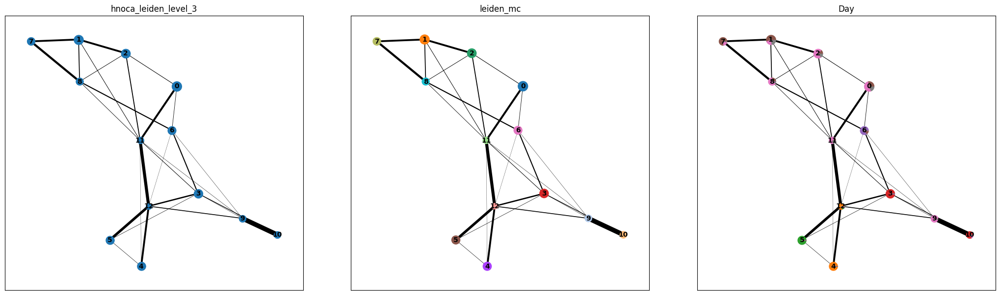

In [9]:
sc.tl.paga(query_adata, groups="leiden_mc")
sc.pl.paga(query_adata, color=["hnoca_leiden_level_3", 'leiden_mc','Day'],threshold=0.03)
sc.tl.umap(query_adata, init_pos='paga')

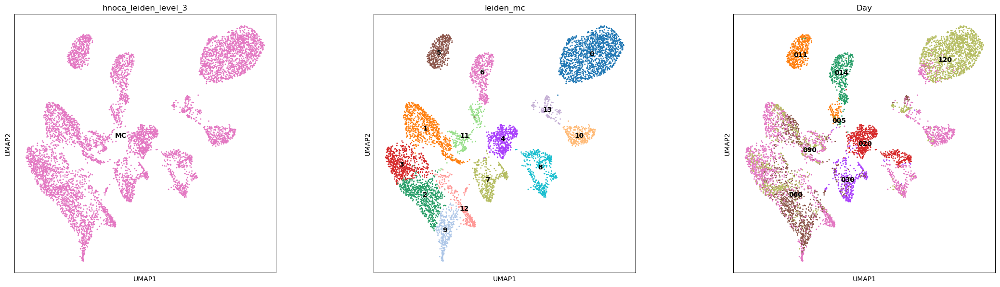

In [9]:
sc.pl.umap(query_adata, color=["hnoca_leiden_level_3", 'leiden_mc','Day'], wspace=0.25, legend_loc='on data')

We see some different populations in the MC annotation with the biggest population being a mix of d30-120. One group is completely out

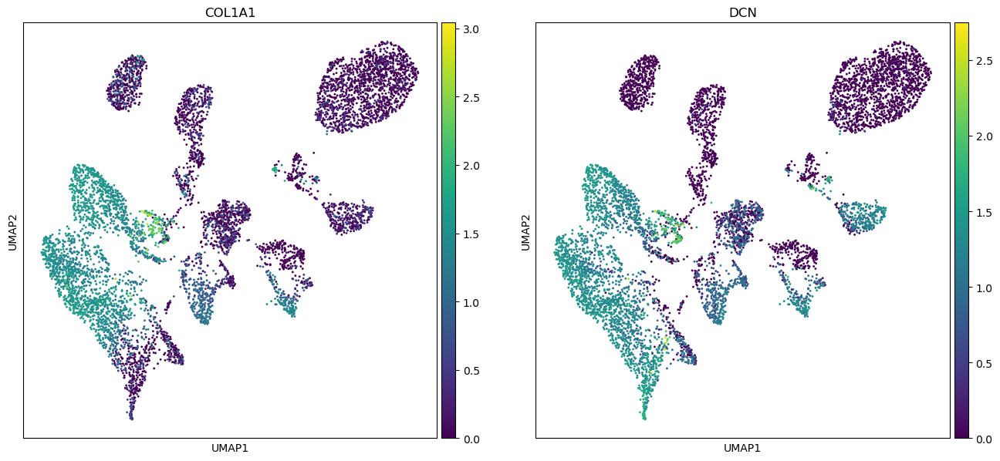

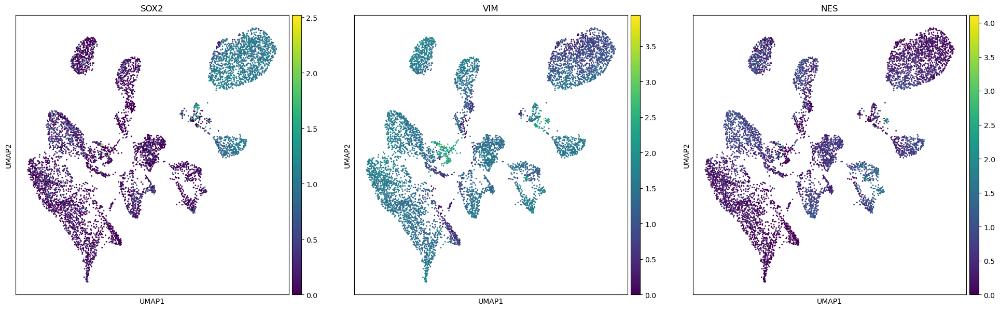

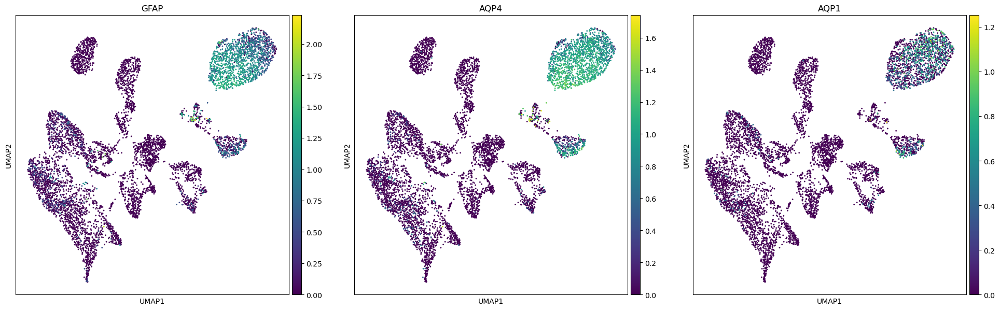

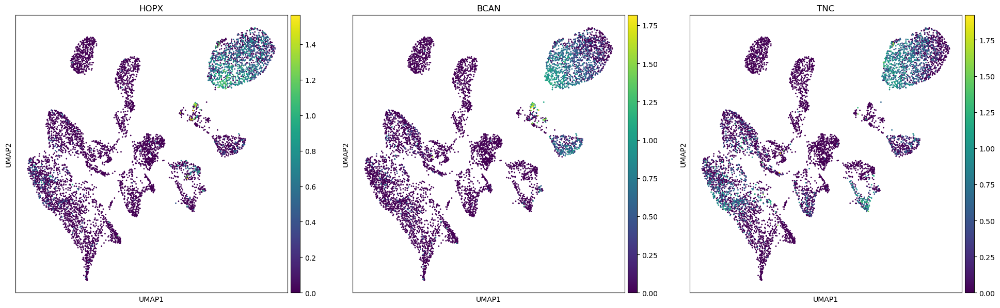

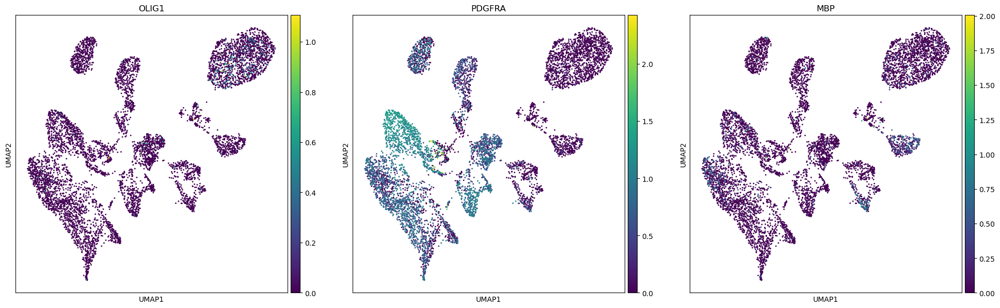

In [10]:
sc.pl.umap(query_adata, color=["COL1A1","DCN"]) #mesenchymal hnoca
sc.pl.umap(query_adata, color=["SOX2","VIM","NES"]) #progenitors hnoca
sc.pl.umap(query_adata, color=["GFAP","AQP4","AQP1"]) #astro hnoca
sc.pl.umap(query_adata, color=["HOPX","BCAN","TNC"]) #glioblast hnoca
sc.pl.umap(query_adata, color=["OLIG1","PDGFRA","MBP"]) #oligo hnoca

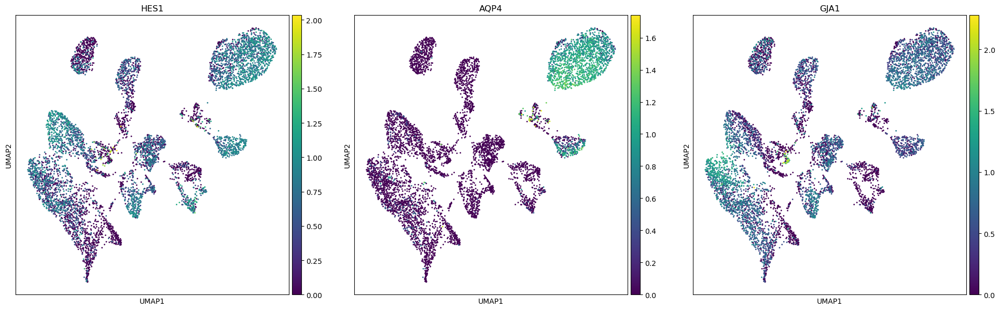

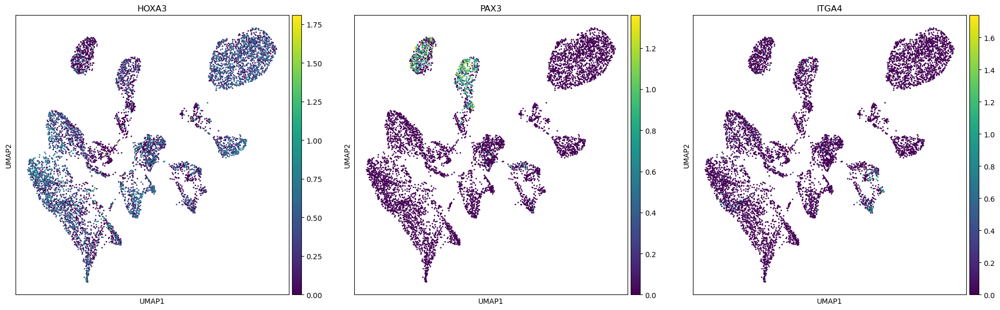

In [51]:
sc.pl.umap(query_adata, color=["HES1","AQP4","GJA1"]) #radial glia, glioblasts-preastrocytes Braun
sc.pl.umap(query_adata, color=["HOXA3","PAX3","ITGA4"])

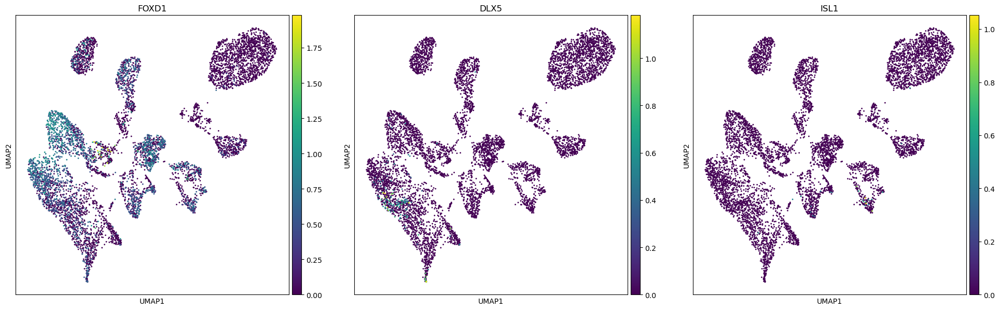

In [92]:
sc.pl.umap(query_adata, color=["FOXD1","DLX5","ISL1"])

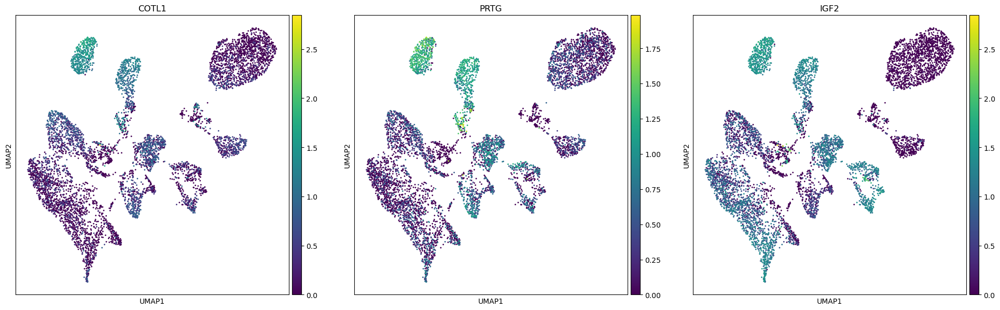

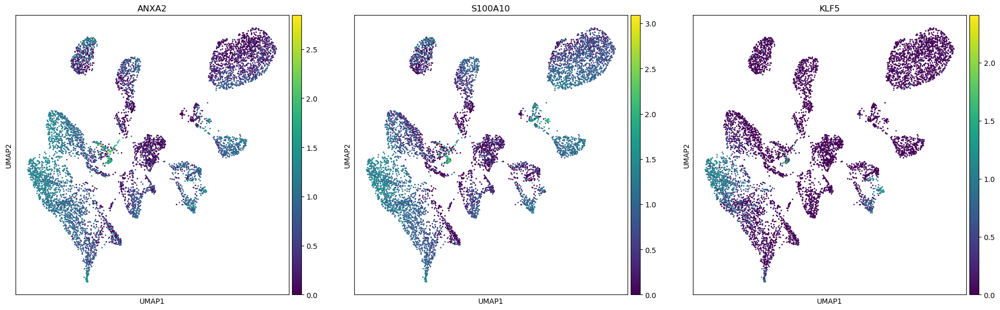

In [79]:
plt.rcParams['figure.figsize']=(7,7)
sc.pl.umap(query_adata, color=["COTL1","PRTG","IGF2"])
sc.pl.umap(query_adata, color=["ANXA2","S100A10","KLF5"])

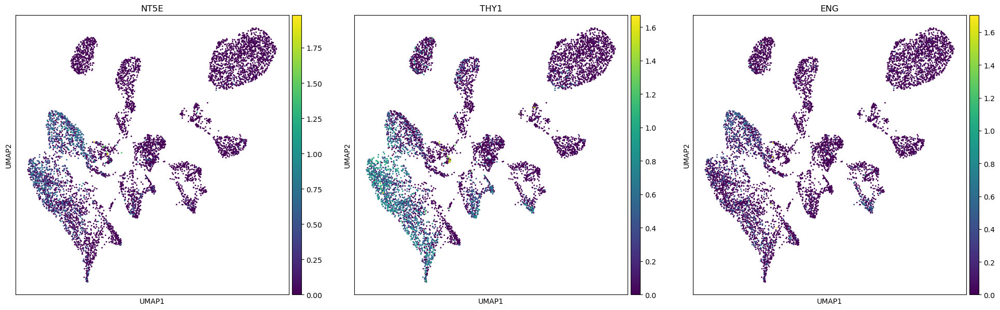

In [17]:
sc.pl.umap(query_adata, color=["NT5E","THY1","ENG"])

Looks like there is some mishap in the annotation and we might have some RG/glioblasts/astrocytes labeled as mc. \
Let's check where they are before we remove them from our annotation


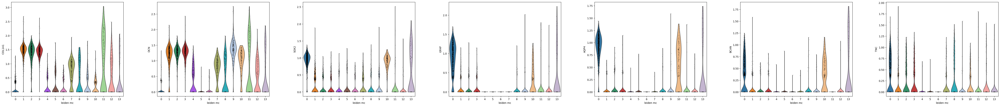

In [44]:
sc.pl.violin(query_adata, keys=["COL1A1","DCN","SOX2","GFAP","AQP4","BCAN","TNC"], groupby='leiden_mc')

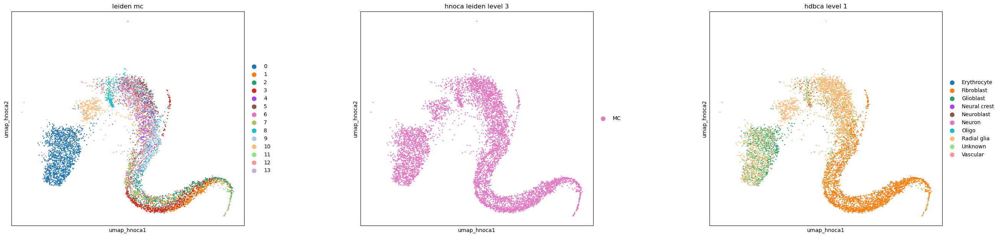

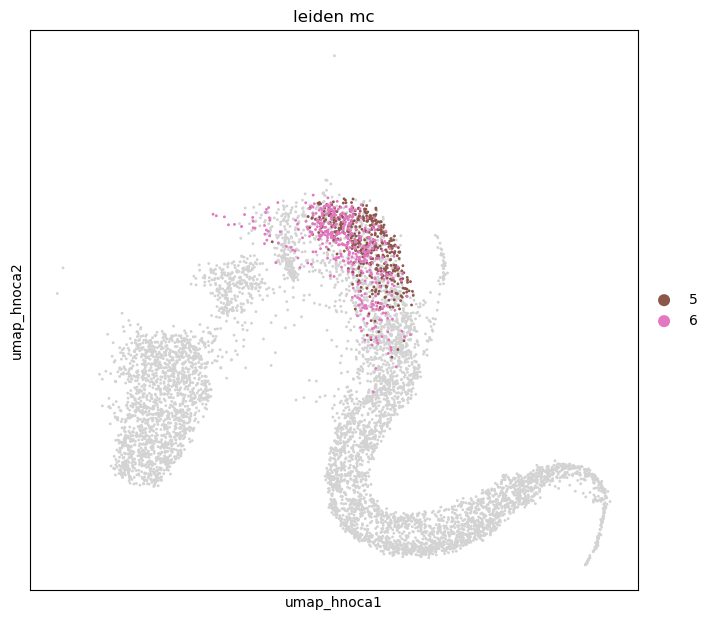

In [84]:
plt.rcParams['figure.figsize']=(7,7)
sc.pl.scatter(query_adata, basis='umap_hnoca', color=['leiden_mc','hnoca_leiden_level_3','hdbca_level_1'])
sc.pl.scatter(query_adata, basis='umap_hnoca', color=['leiden_mc'], groups=['5','6'])

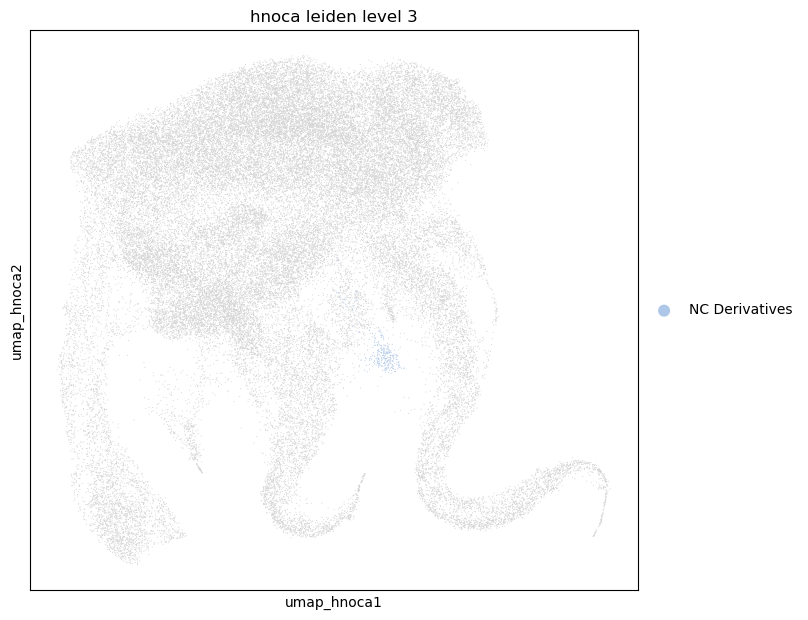

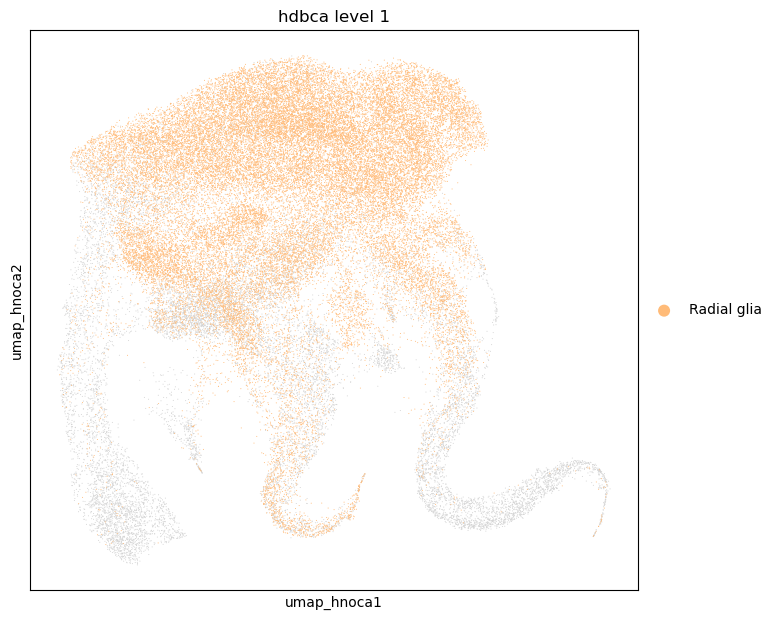

In [49]:
sc.pl.scatter(adata, basis='umap_hnoca', color=['hnoca_leiden_level_3'], groups='NC Derivatives')
sc.pl.scatter(adata, basis='umap_hnoca', color=['hdbca_level_1'], groups='Radial glia')

In [7]:
reannot = {"0":"Glioblast",
    "1":"MC",
    "2":"MC",
    "3":"MC",
    "4":"MC",
    "5":"MC",
    "6":"MC",
    "7":"MC",
    "8":"MC",
    "9":"MC",
    "10":"NPC",
    "11":"MC",
    "12":"MC",
    "13":"Glioblast"}

In [8]:
adata.obs['leiden_mc'] = query_adata.obs['leiden_mc'].copy()
adata.obs['leiden_mc'].value_counts()

leiden_mc
0     778
1     688
2     585
3     527
4     447
5     433
6     404
7     332
8     256
9     202
10    195
11    165
12     99
Name: count, dtype: int64

In [18]:
adata.obs['reannotation'] = adata.obs['leiden_mc'].map(reannot)
adata.obs['reannotation'].value_counts()

reannotation
MC           4138
Glioblast     778
NPC           195
Name: count, dtype: int64

In [12]:
adata.obs['reannotation'].fillna(adata.obs['hnoca_level_1'], inplace=True)
print(adata.obs['reannotation'].value_counts())

reannotation
NPC                21972
Neuroepithelium    19919
MC                  5809
Neuron              3536
Glioblast           1867
PSC                 1229
OPC                  371
Astrocyte            360
NC Derivatives       258
CP                     6
Name: count, dtype: int64
hnoca_level_1
NPC                21782
Neuroepithelium    19960
MC                  6668
Neuron              3536
PSC                 1295
Glioblast           1089
OPC                  371
Astrocyte            360
NC Derivatives       260
CP                     6
Name: count, dtype: int64


In [13]:
adata.obs['hnoca_level_1'] = adata.obs['reannotation']

In [15]:
adata.obs['reannotation'].fillna(adata.obs['hnoca_level_2'], inplace=True)
print(adata.obs['reannotation'].value_counts())

reannotation
Non-telencephalic NPC          21768
Neuroepithelium                19919
MC                              5809
Non-telencephalic Neuron        3520
Glioblast                       1867
PSC                             1229
OPC                              372
Astrocyte                        360
NC Derivatives                   258
NPC                              195
Dorsal Telencephalic Neuron       15
Dorsal Telencephalic NPC           9
CP                                 6
Name: count, dtype: int64


In [16]:
adata.obs['reannotation'] = adata.obs['reannotation'].replace('NPC', 'Non-telencephalic NPC')


In [17]:
adata.obs['hnoca_level_2'] = adata.obs['reannotation']

In [19]:
adata.obs['reannotation'].fillna(adata.obs['hnoca_level_3'], inplace=True)
print(adata.obs['reannotation'].value_counts())

reannotation
Neuroepithelium                22086
Medulla NPC                     6468
MC                              6011
Pons NPC                        4633
Ventral Midbrain NPC            4243
Medulla Neuron                  2297
Glioblast                       1881
Hypothalamic NPC                1352
PSC                             1229
Dorsal Midbrain NPC             1202
Cerebellar NPC                  1041
Pons Neuron                      464
Thalamic NPC                     414
OPC                              382
Astrocyte                        360
NC Derivatives                   264
Cerebellar Neuron                245
Hypothalamic Neuron              219
NPC                              195
Thalamic Neuron                  155
Ventral Midbrain Neuron           69
Dorsal Midbrain Neuron            64
Dorsal Telencephalic Neuron       30
Dorsal Telencephalic NPC          12
CP                                11
Name: count, dtype: int64


In [20]:
adata.obs['hnoca_level_3'] = adata.obs['reannotation']

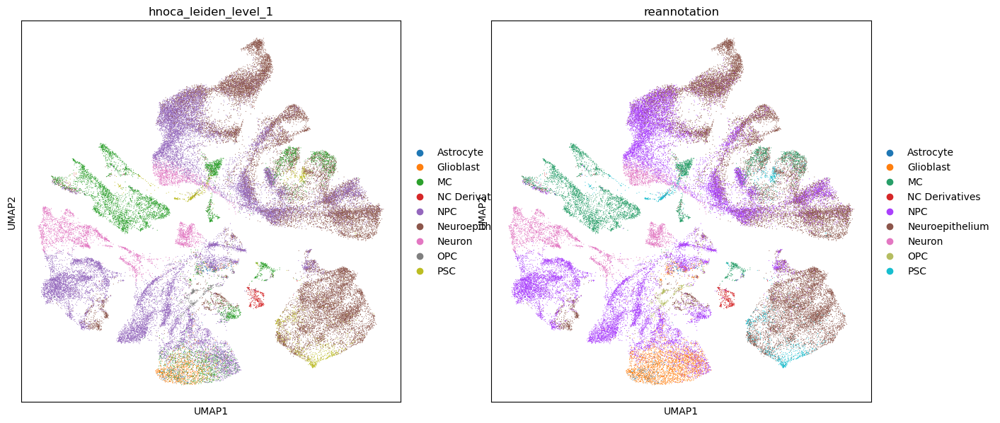

In [14]:
sc.pl.umap(adata, color=['hnoca_leiden_level_1','reannotation'])

In [15]:
adata.obs['reannotation'].to_csv('/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/scripts/04_merge_annotations/reannotations/reannotation_mc.csv')

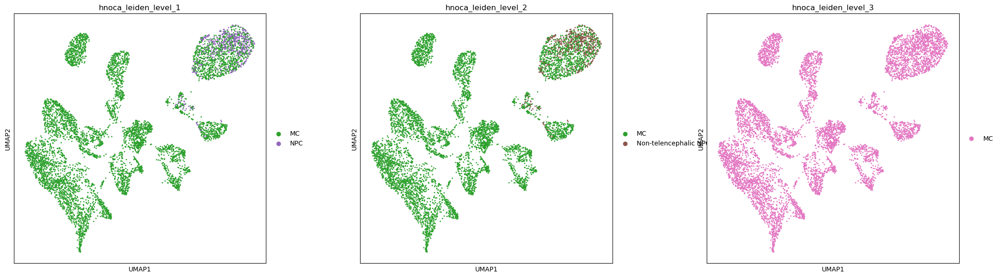

In [125]:
sc.pl.umap(query_adata, color=['hnoca_leiden_level_1','hnoca_leiden_level_2','hnoca_leiden_level_3'], wspace=0.25)

In [193]:
adata.write_h5ad('/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/BRO_timecourse/BRO_RA1_exp023_annotated.h5ad')